#IBEX Energetic Neutral Atoms All Sky Maps
A significant approach to imagining the heliosphere is to detect [Energetic Neutral Atoms (ENA's)](http://ibex.swri.edu/students/What_are_energetic_neutral.shtml). ENA's are created when a charged particle from the Solar Wind or energetic particles interacts with a neutral atom coming from the interstellar medium. These can exchange an electron from one to the other creating an ENA and a Pickup-Ion (PUI). Since the ENA is neutral, it is not affected by magnetic fields and continues on a ballistic trajectory carrying the information (energy and composition) of the energetic particle population it was created from. The [IBEX mission](https://science.nasa.gov/mission/ibex/), and its follow on mission [IMAP](https://science.nasa.gov/mission/imap/), are designed to create all-sky maps of ENA flux at various energies.  

This notebook allows you to explore the latest release of the all-sky maps from IBEX. To use it, you will need to download that release from the [IBEX Data Repository](https://ibex.princeton.edu/DataRelease) and place it in a convient directory on your Google Drive (The directory with this notebook already contains the data from Data Release 18).

## Part 1: Getting Started (10 Minutes)
The next couple of cells setups up the file system and loads some packages that are needed.
- It will ask you to log into your Google account. Follow the prompts as they appear.  

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
cd /content/drive/MyDrive/SHIELD/ENA_Maps_Shield/

/content/drive/MyDrive/SHIELD/ENA_Maps_Shield


### Loading Standard Packages

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colormaps
import ipywidgets as widgets
from IPython.display import display

### Loading Packages Specific to the Notebook
The next cell will load packages that were written for this notebook. These should be in .py files that are in the directory where this notebook lives and that you changed to after connecting to your Google Drive.  

In [4]:
import json
from loadibex import load_json, load_ibexfile_std as load
import loadibex as lix
import map_rotated

## Data Available
There are a few choices to make when looking at IBEX Data.  These include instrument, energy bin, and year.

**Instrument and Energy Bins**: IBEX has two ENA instruments on it cleveraly named IBEX-Lo and IBEX-Hi.

IBEX-Lo has 8 energy channels with the following energy bins

channel #|mid-energy (eV)
-------|----------
1|15
2|29
3|55
4|110
5|209
6|439
7|872
8|1821

IBEX-hi has 5  energy channels (channels 2 - 6) with the following energy bins.

channel #|mid-energy (eV)
-------|----------
2|710
3|1110
4|1740
5|2730
6|4290

You will have to select both the this intrument using 'is_hi = True', and the channel number using 'ebin'

**Year**: While the 'year = 20XX" is self explanitory. The data availability is
- IBEX-Lo: 2009 - 2019
- IBEX-Hi: 2009 - 2023

###Discussion
- Consider the energy bins for IBEX-Lo and IBEX-Hi.  How can you campare one data set to the other?
- What could be the cause of the data to vary from year to year?

##Loading Data
The cell below loads data from 2009 collected in the channel 3 energy bin from IBEX-Hi.
The cell below loads data from IBEX-Hi ('is_hi=True') energy channel 3 ('ebin=3') collected in 2009 ('year=2009'). The quantity is the flux rate of ENA's


In [5]:
# for lo 2009 - 2019
# for high 2009 - 2023
# qty = 'flux', 'fvar', 'fexp'

lons, lats, data = lix.load_ibexfile_std(is_hi=True, ebin = 3, year=2010, qty='flux')
data[ np.where(data<=0) ] = np.nan

##First Map
The next cell will plot an all-sky view of the ENA flux using a [Mollweide Projection](https://en.wikipedia.org/wiki/Mollweide_projection). This projection distorts the shape of each cell on the sphere, particularly at the sides of projection, but perserves the relative area of each of the cells.

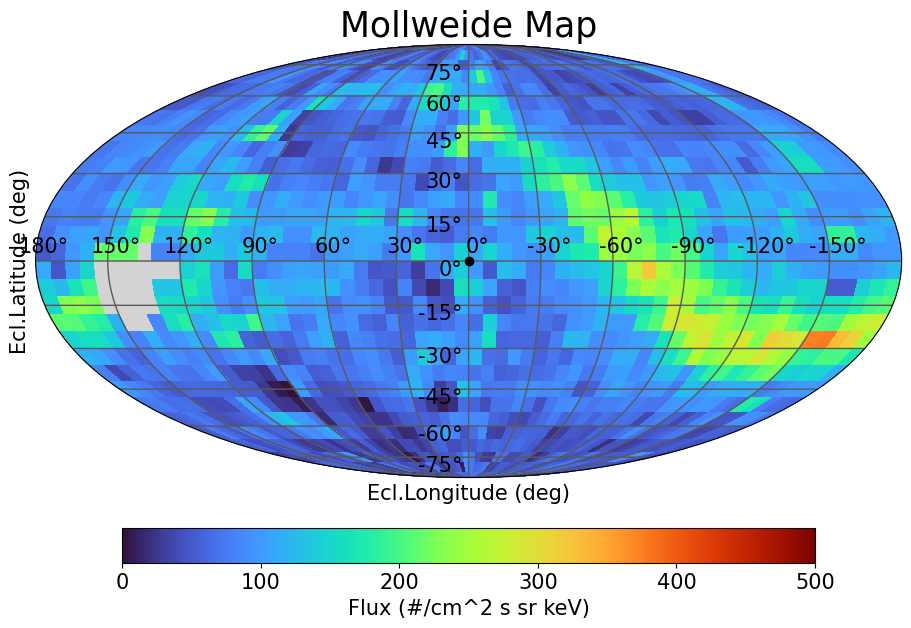

In [8]:
#=Set map center coordinates =============================
alf = 35  # angle between old pole and new pole
phi = -30  # longitude where the new pole is
th = 0 # end rotation towards positive azimuth
#=These variables can be overridden by
#=using the 'orientation_kw' or orientation keyword=======

fig, ax = map_rotated.plot_rotated_map(lons, lats, data, alf=alf, phi=phi, th=th,
                                       #title='IBEX-Hi 1.11keV (2009)',
                                       cmap = 'turbo',
                                       #cmap=cmc.batlow, grid_color= 'k',
                                       # cbar_kwargs={'location':'right','aspect':28, 'fraction':0.7},
                                       # center_meridian=True,
                                       tick_font= 30,
                                       orientation_kw= 'ecl',
                                       font_scale = 0.5, #adjust font size
                                       vmin = 0, vmax = 500, #set coloar map scale
                                       figsize = (9,6), #set figure size ratio
                                       )
plt.plot(0,0,'ok') # place a point in the middle of the plot.
#plt.text(.03,.02,'Nose', fontsize= 30)
plt.show()

### Plotting Options (5 minutes)
Many of the [plot options](https://matplotlib.org/stable/api/figure_api.html) available Matplotlib can be used here. Listed are a few you might find useful.

**Color Maps**

The choice of color map can help or hurt data interpretation. The 'turbo' color map is a default and closest to the [IBEX mission standard color map](http://ibex.swri.edu/multimedia/img/datamap0.6-1.0.jpg).  You may want to try different [color maps](https://matplotlib.org/stable/users/explain/colors/colormaps.html) available in the Matplotlib package. Spend (just) a few minutes exploring a few of the 'sequental' color maps available.

**Fixing Color Scale**

When compare maps with different parameters, particlarly with the same energy for different years, it is helpful to fix the minimum and maximum of color map using the "vmin" and "vmax" keywords.  
#### Discussion
* In your group, agree on one of the color map to use for the rest of the lab (or disagree and compare what you find).
* Compare maps from diffent years using the same limits on the color bar.  


### Map Orientation (10 minutes)
These maps can be rotated to so that a section of interest can be brought to the center of the map. The coordinate system for this map is the "ecliptic" coordinate system where the pole is normal to the ecliptic plane and longitude is measured relative to the Spring equanox line.  

You can set the orientation in a couple of ways. First you can set is using the angle variables - 'alf', 'phi', 'th'. You can also set the using orientation using the following keywords in the 'orientation_kw'.
* ecl - [elciptic coordinates](https://en.wikipedia.org/wiki/Ecliptic_coordinate_system) represented by [this image](https://en.wikipedia.org/wiki/Ecliptic_coordinate_system#/media/File:Heliocentric_rectangular_ecliptic.png)
* nose - set the heliosphere nose in the center (lon = 255, lat = 5).  This is the interstellar medium (ISM)upstream side of the heliosphere.
* tail - The portion of the heliosphere downstream of the ISM is centered in the map (lon = 75, lat = -5).
* ribbon_c - A feature called the IBEX ribbon and this is the center of the feature.
* ribbon - Looks a IBEX ribbon edge on.  

### Discussion
- Select a few of these orientations and identify different features you see in the data.  

# Part 2 Explorations
Using the tools above, work with your groups to complete one of the explorations described below

## Exploration 1: Identify Features in the IBEX data

Continue the exploration from the previous part and look at all the featuers of the heliosphere. Check a few different energy bins in IBEX-Hi
Can you identify:
- The ribbon
- Features of the nose
- Features of the tail
- The lobes in the tail

Try a few different energy ranges for this as well.
- For each feature, which energy range best illustrates it.  

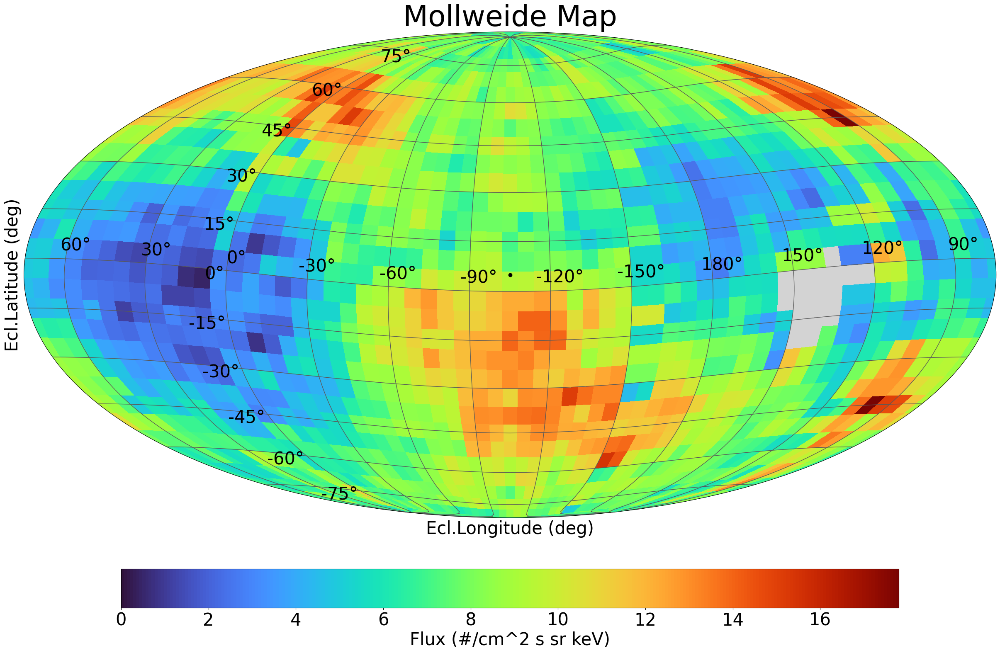

In [ ]:
#Copy Code Cells here
lons, lats, data = lix.load_ibexfile_std(is_hi=True, ebin=6, year=2010, qty='flux')
data[ np.where(data<=0) ] =np.nan


fig, ax = map_rotated.plot_rotated_map(lons, lats, data, alf=alf, phi=phi, th=th,
                                       cmap = 'turbo',
                                       #cmap=cmc.batlow, grid_color= 'k',
                                       # cbar_kwargs={'location':'right','aspect':28, 'fraction':0.7},
                                       # center_meridian=True,
                                       tick_font= 30,
                                       orientation_kw= 'nose',)

plt.plot(0,0,'ok')
#plt.text(.03,.02,'Nose', fontsize= 30)
plt.show()

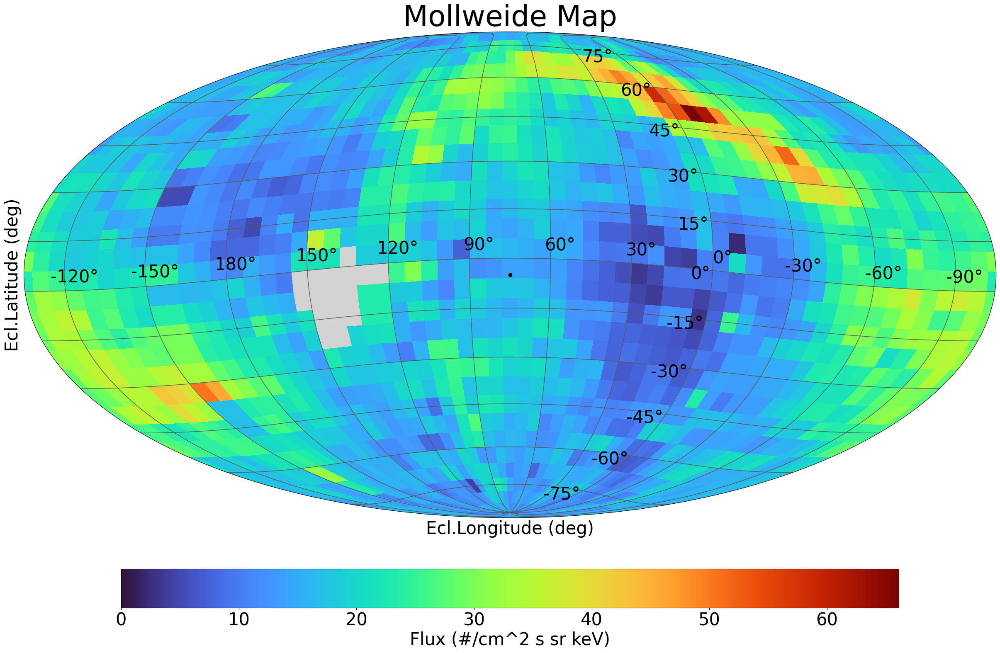

In [ ]:
#Copy Code Cells here
lons, lats, data = lix.load_ibexfile_std(is_hi=True, ebin=5, year=2010, qty='flux')
data[ np.where(data<=0) ] =np.nan


fig, ax = map_rotated.plot_rotated_map(lons, lats, data, alf=alf, phi=phi, th=th,
                                       cmap = 'turbo',
                                       #cmap=cmc.batlow, grid_color= 'k',
                                       # cbar_kwargs={'location':'right','aspect':28, 'fraction':0.7},
                                       # center_meridian=True,
                                       tick_font= 30,
                                       orientation_kw= 'tail',)

plt.plot(0,0,'ok')
#plt.text(.03,.02,'Nose', fontsize= 30)
plt.show()

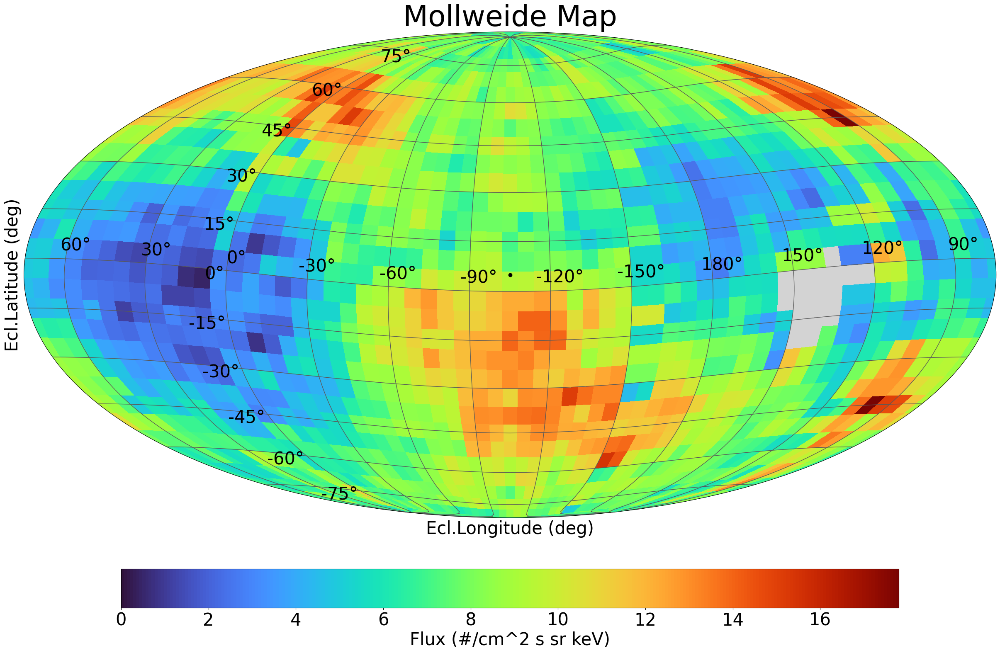

In [ ]:
#Copy Code Cells here
lons, lats, data = lix.load_ibexfile_std(is_hi=True, ebin=6, year=2010, qty='flux')
data[ np.where(data<=0) ] =np.nan


fig, ax = map_rotated.plot_rotated_map(lons, lats, data, alf=alf, phi=phi, th=th,
                                       cmap = 'turbo',
                                       #cmap=cmc.batlow, grid_color= 'k',
                                       # cbar_kwargs={'location':'right','aspect':28, 'fraction':0.7},
                                       # center_meridian=True,
                                       tick_font= 30,
                                       orientation_kw= 'nose',)

plt.plot(0,0,'ok')
#plt.text(.03,.02,'Nose', fontsize= 30)
plt.show()

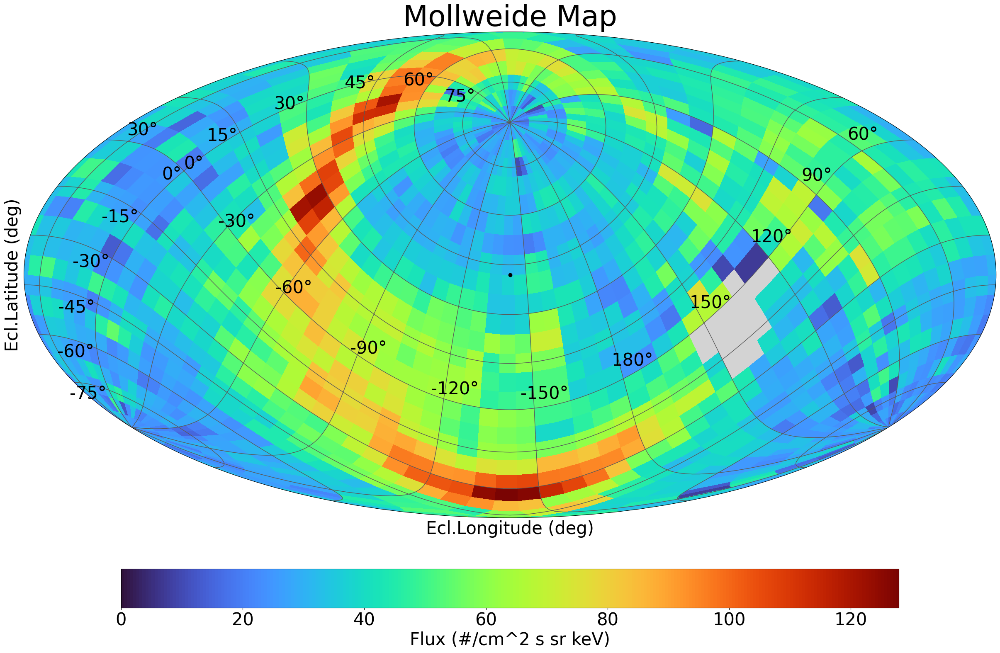

In [ ]:
#Copy Code Cells here
i = 6 # set channel
year_data = 2016 # set year
lons, lats, data = lix.load_ibexfile_std(is_hi=True, ebin=4, year=2010, qty='flux')
data[ np.where(data<=0) ] =np.nan


fig, ax = map_rotated.plot_rotated_map(lons, lats, data, alf=alf, phi=phi, th=th,
                                       cmap = 'turbo',
                                       #cmap=cmc.batlow, grid_color= 'k',
                                       # cbar_kwargs={'location':'right','aspect':28, 'fraction':0.7},
                                       # center_meridian=True,
                                       tick_font= 30,
                                       orientation_kw= 'ribbon_c',)

plt.plot(0,0,'ok')
#plt.text(.03,.02,'Nose', fontsize= 30)
plt.show()

## Exploration 2: Compare IBEX-Lo to IBEX-Hi
There is significant overlap between the highest channels of IBEX-Lo and the lowest channels of IBEX-Hi.  
- Choose a common orientation and year, and compare the features you see in that are similar as well as the differences.  


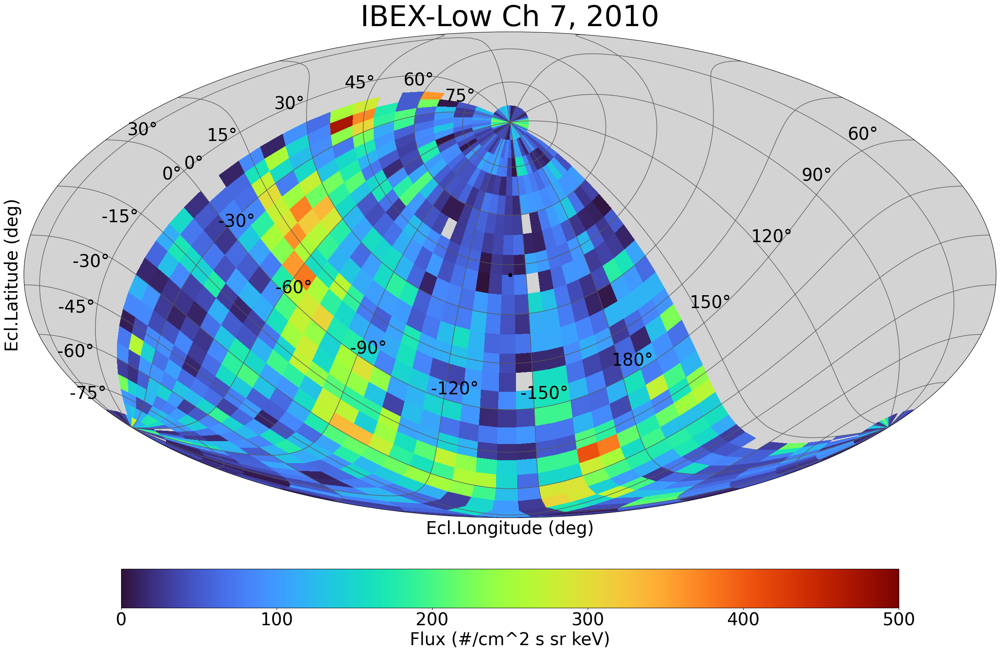

In [ ]:
#Copy Code Cells here
i = 7
year_data = 2010
lons, lats, data = lix.load_ibexfile_std(is_hi=False, ebin=i, year=year_data, qty='flux')
data[ np.where(data<=0) ] =np.nan

fig, ax = map_rotated.plot_rotated_map(lons, lats, data, alf=alf, phi=phi, th=th,
                                       title = 'IBEX-Low Ch 7, 2010',
                                       cmap = 'turbo',
                                       #cmap=cmc.batlow, grid_color= 'k',
                                       # cbar_kwargs={'location':'right','aspect':28, 'fraction':0.7},
                                       # center_meridian=True,
                                       tick_font= 30,
                                       orientation_kw= 'ribbon_c',
                                       #figsize=(15, 12),
                                       vmin = 0, vmax = 500,
                                       )

plt.plot(0,0,'ok') #puts a dot in the center of the map
#plt.text(.03,.02,'Nose', fontsize= 30)
plt.show()

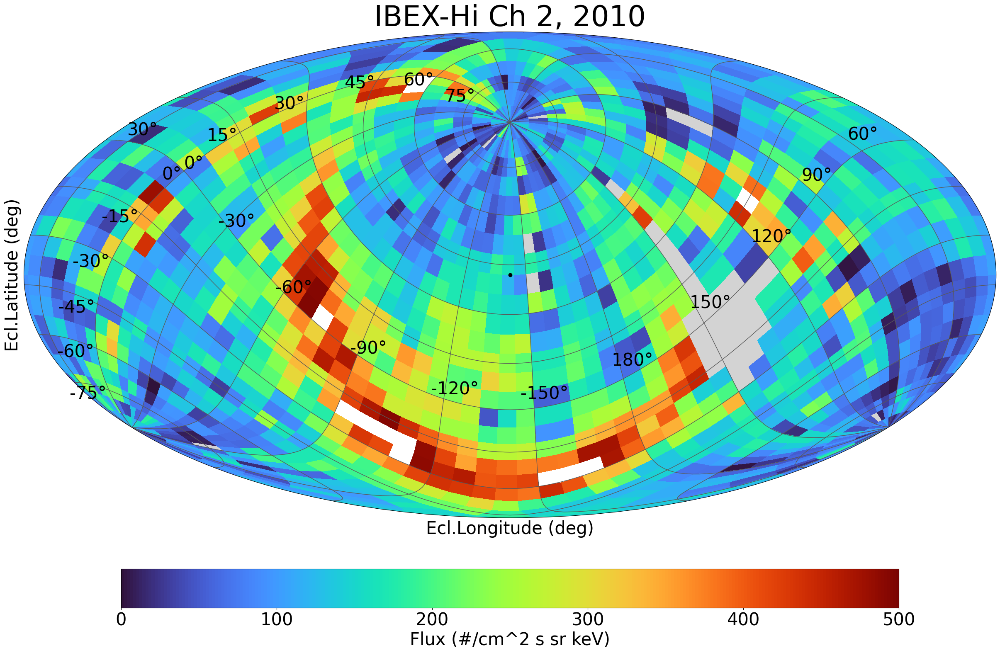

In [ ]:
#Copy Code Cells here
i = 2
year_data = 2010
lons, lats, data = lix.load_ibexfile_std(is_hi=True, ebin=i, year=year_data, qty='flux')
data[ np.where(data<=0) ] =np.nan

fig, ax = map_rotated.plot_rotated_map(lons, lats, data, alf=alf, phi=phi, th=th,
                                       title = 'IBEX-Hi Ch 2, 2010',
                                       cmap = 'turbo',
                                       #cmap=cmc.batlow, grid_color= 'k',
                                       # cbar_kwargs={'location':'right','aspect':28, 'fraction':0.7},
                                       # center_meridian=True,
                                       tick_font= 30,
                                       orientation_kw= 'ribbon_c',
                                       #figsize=(15, 12),
                                       vmin = 0, vmax = 500,
                                       )

plt.plot(0,0,'ok')
#plt.text(.03,.02,'Nose', fontsize= 30)
plt.show()

## Exploration 3: Explore Heliosphere Throughout the Solar Cycle

Choose the 'ribbon_c' or 'nose' orientation and choose one or two energy channels. Explore data from throughout the [solar cycle](https://www.swpc.noaa.gov/products/solar-cycle-progression).

- How do the features of the ENA maps change throughout the cycle?
- Save the results to share with the group.



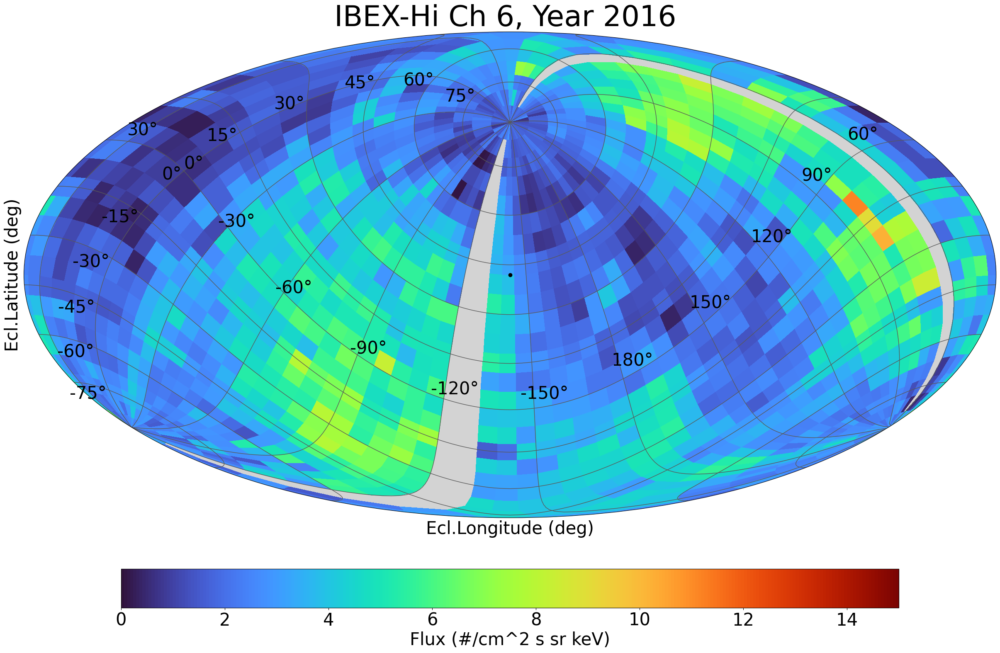

In [ ]:
#Copy Code Cells here
i = 6 # set channel
year_data = 2016 # set year
gph_title = f"IBEX-Hi Ch {i}, Year {year_data} "
lons, lats, data = lix.load_ibexfile_std(is_hi=True, ebin=i, year=year_data, qty='flux')
data[ np.where(data<=0) ] =np.nan

fig, ax = map_rotated.plot_rotated_map(lons, lats, data, alf=alf, phi=phi, th=th,
                                       title = gph_title,
                                       cmap = 'turbo',
                                       #cmap=cmc.batlow, grid_color= 'k',
                                       # cbar_kwargs={'location':'right','aspect':28, 'fraction':0.7},
                                       # center_meridian=True,
                                       tick_font= 30,
                                       orientation_kw= 'ribbon_c',
                                       #figsize=(15, 12),
                                       vmin = 0, vmax = 15,
                                       )

plt.plot(0,0,'ok')
#plt.text(.03,.02,'Nose', fontsize= 30)
plt.show()

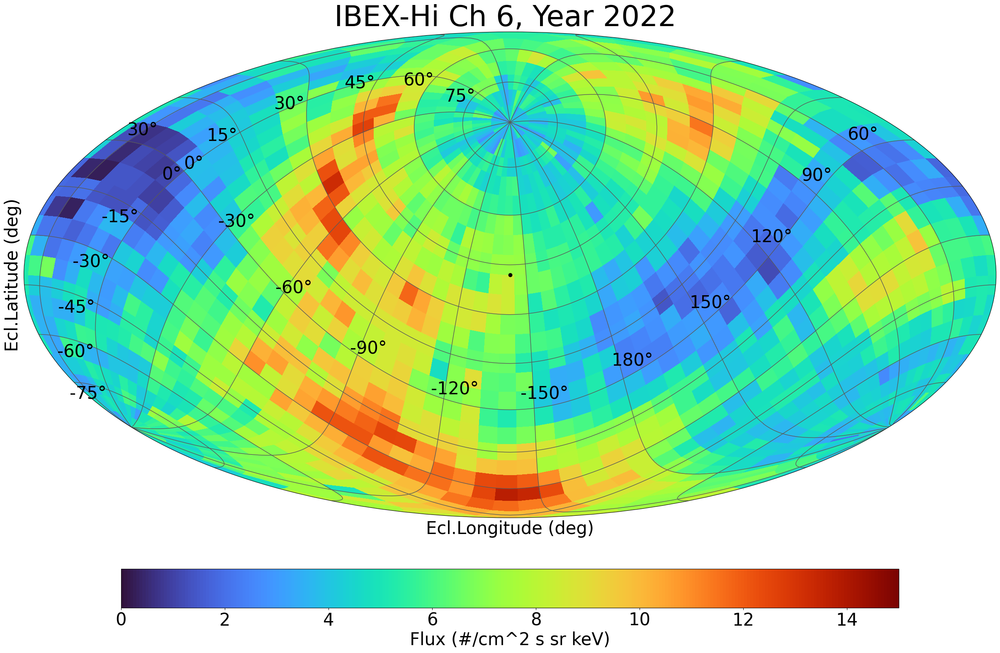

In [ ]:
#Copy Code Cells here
i = 6 # set channel
year_data = 2022 # set year
gph_title = f"IBEX-Hi Ch {i}, Year {year_data} "
lons, lats, data = lix.load_ibexfile_std(is_hi=True, ebin=i, year=year_data, qty='flux')
data[ np.where(data<=0) ] =np.nan

fig, ax = map_rotated.plot_rotated_map(lons, lats, data, alf=alf, phi=phi, th=th,
                                       title = gph_title,
                                       cmap = 'turbo',
                                       #cmap=cmc.batlow, grid_color= 'k',
                                       # cbar_kwargs={'location':'right','aspect':28, 'fraction':0.7},
                                       # center_meridian=True,
                                       tick_font= 30,
                                       orientation_kw= 'ribbon_c',
                                       #figsize=(15, 12),
                                       vmin = 0, vmax = 15,
                                       )

plt.plot(0,0,'ok')
#plt.text(.03,.02,'Nose', fontsize= 30)
plt.show()

## Exploration 4: Exploring the Ribbon in Different Energy Ranges

Use the 'ribbon_c' orientation and and explore the features of the ribbon throughout the energy range.  
- For which energy range is the ribbon most promonent?
- What does that indicate about the energy of the plasma population that produces these ENA's?

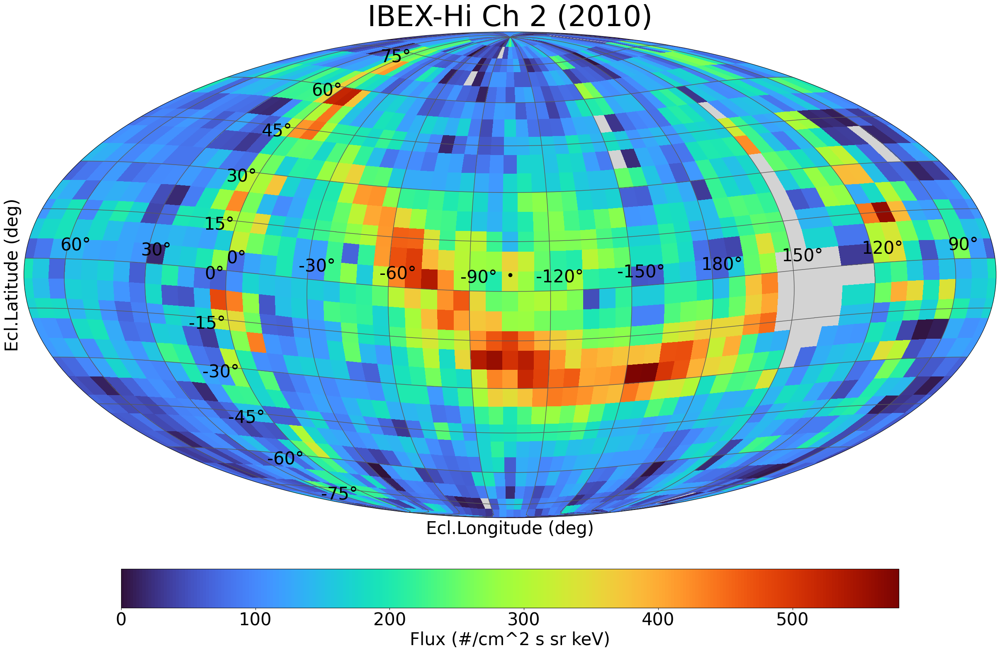

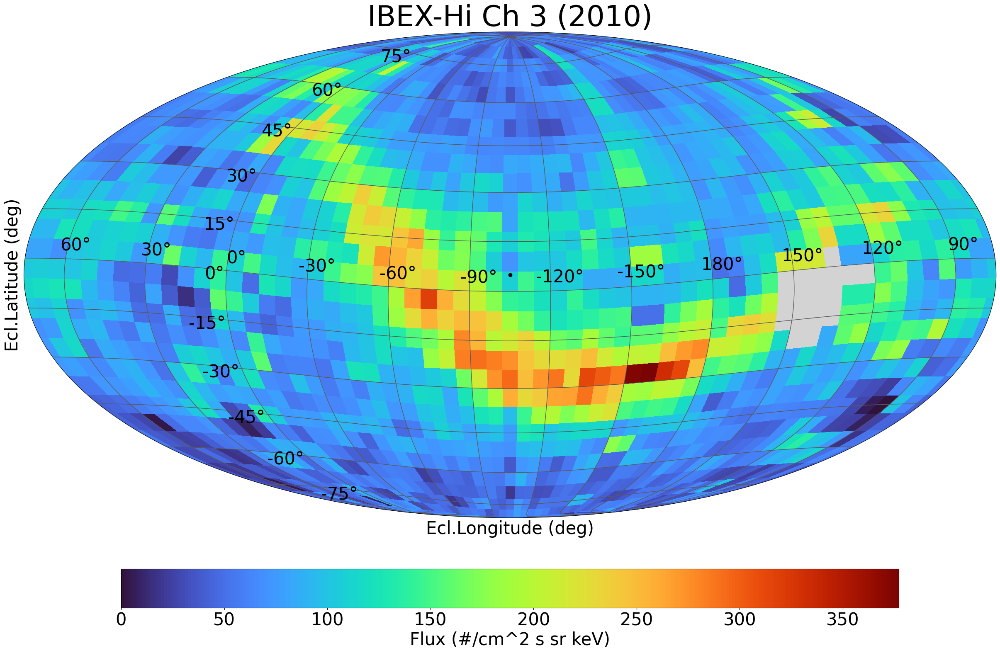

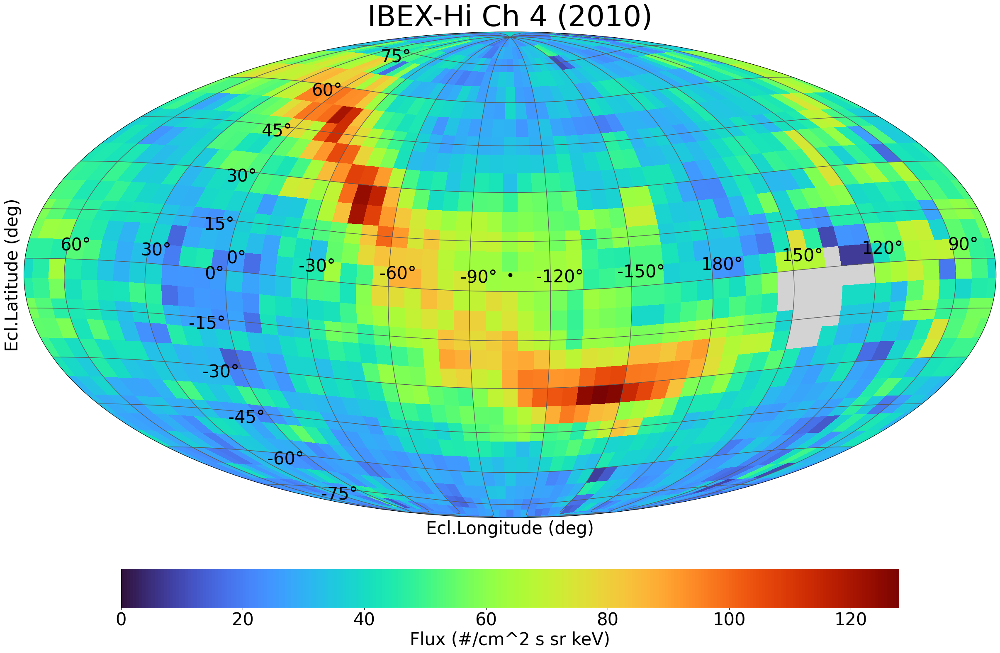

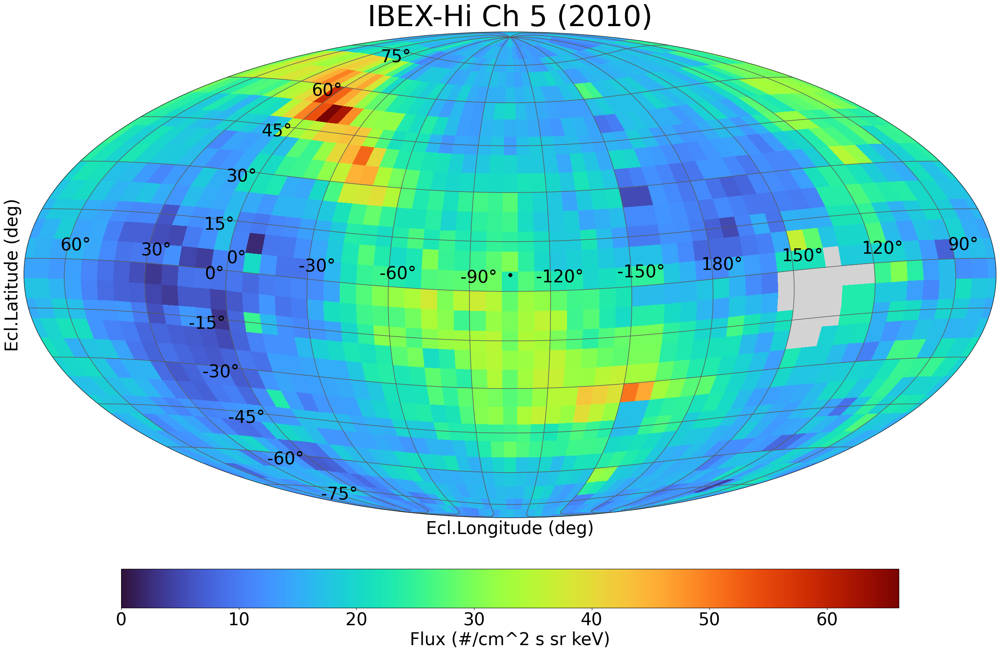

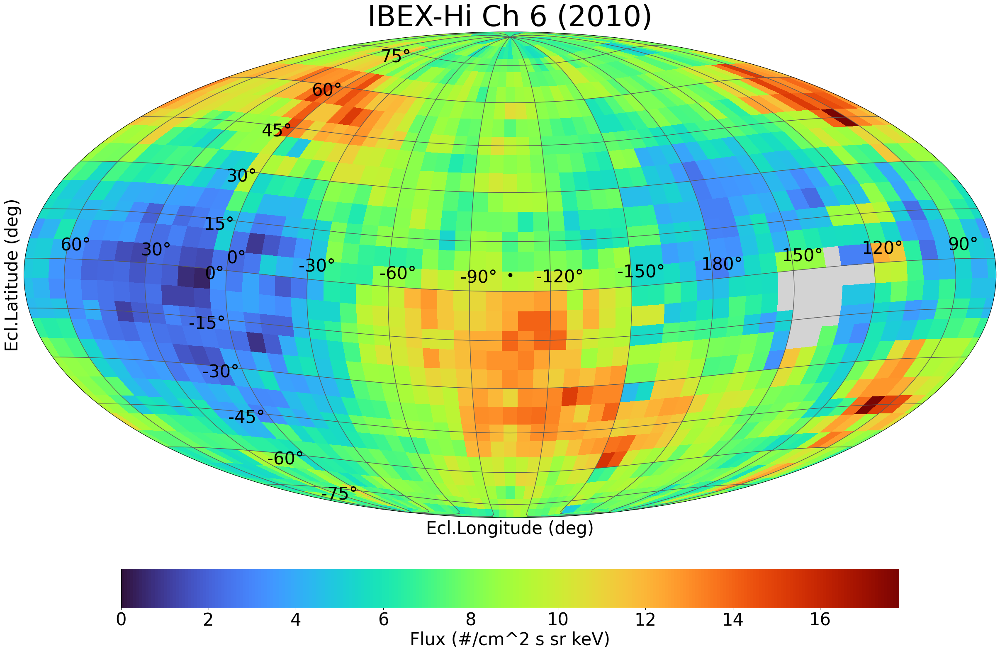

In [ ]:
#Copy Code Cells here
from google.colab import output
for i in range(2,7):
  gph_title = f"IBEX-Hi Ch {i} (2010)"
  lons, lats, data = lix.load_ibexfile_std(is_hi=True, ebin=i, year=2010, qty='flux')
  data[ np.where(data<=0) ] =np.nan

  fig, ax = map_rotated.plot_rotated_map(lons, lats, data, alf=alf, phi=phi, th=th,
                                       #title='IBEX-Hi Ch 2 (2010)',
                                       title = gph_title,
                                       cmap = 'turbo',
                                       #cmap=cmc.batlow, grid_color= 'k',
                                       # cbar_kwargs={'location':'right','aspect':28, 'fraction':0.7},
                                       # center_meridian=True,
                                       tick_font= 30,
                                       orientation_kw= 'nose',
                                       #figsize=(15, 12),
                                        )

  plt.plot(0,0,'ok')
  #plt.text(.03,.02,'Nose', fontsize= 30)
  plt.show()
